In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1563.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_854.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1404.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1194.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1772.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_934.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1461.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_60.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_296.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1011.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1254.png
/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_798.pn

# Introduction

**The fascinating topic of digital image processing includes a wide range of methods for improving and modifying photographs for different purposes. The investigation and application of spatial and frequency domain improvements to a dataset will be the main emphasis of this assignment. Gaining knowledge of spatial domain image processing methods, putting them into practice, and then investigating approaches in the frequency domain are the key goals.
The ultimate goal is to analyze the effectiveness of these enhancement techniques on the chosen dataset and draw meaningful conclusions based on the results.**

# 1- Dataset Selection and Kaggle Account Creation

I have chosen the COVID 19, PNEUMONIA, NORMAL chest X-ray image dataset.
The directory structure consists of medical images divided into three subfolders (COVID, NORMAL, PNEUMONIA), which contain Chest X-ray (CXR) Images.
There are 1626 images in the COVID subfolder, 1802 images in the NORMAL subfolder, and 1800 images in the PNEUMONIA subfolder.
All the images have been preprocessed and resized to 256x256 pixels in PNG format.
The goal is to assist researchers and the medical community in utilizing Deep Learning to detect and classify COVID19 and Pneumonia from the Chest X-Ray Images.

**Displaying 10 images for each class:**

**1.Selecting the COVID Class**

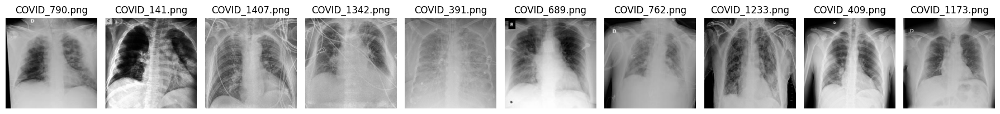

In [4]:
import os
import matplotlib.pyplot as plt

# Covid folder path that contains the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Display the images in a single row
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjusting the figsize as needed
for i, ax in enumerate(axes):
    if i < len(image_filenames):  # Ensuring that we don't access beyond the number of images available
        image_path = os.path.join(folder_path, image_filenames[i])
        image = plt.imread(image_path)
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(image_filenames[i])
plt.tight_layout()
plt.show()


**2.Selecting the NORMAL class**

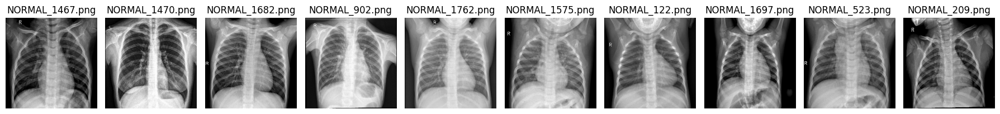

In [15]:
import os
import matplotlib.pyplot as plt

# Normal folder path contains the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Display the images in a single row
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjusting the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = plt.imread(image_path)
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


**3.Selecting the PNEUMONIA class**

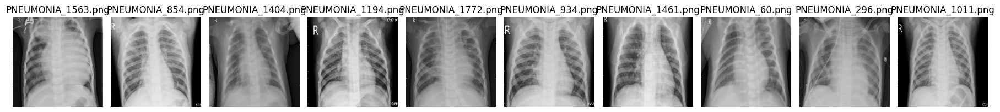

In [16]:
import os
import matplotlib.pyplot as plt

# PNEUMONIA folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Display the images in a single row
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjusting the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = plt.imread(image_path)
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


#  2- Image Enhancements

**Implementing four enhancement techniques:**
2.1- Spatial domain enhancement techniques 
 2.1.1-Histogram equalization: is used to transform the gray-level values so the histogram covers the entire gray level image.
 2.1.2-Spatial filtering: it modifies the intensity of each pixel of an image.
2.2- Frequency domain enhancement methods 
 2.2.1-Fourier Transform for filtering: is used to transform an image into frequency domain.
 2.2.2-Frequency domain smoothing/sharpening
 


**Perform the 4 enhancement techniques for the COVID class**

2.1.1 Histogram equalization: In the Covid class I displayed 10 images and then I applied the histogram equalization.

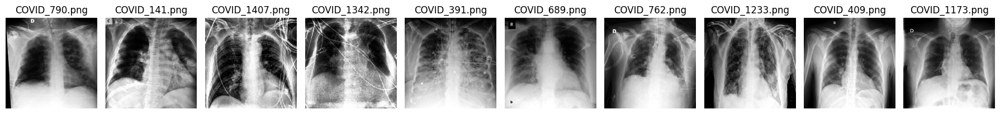

In [6]:
import os
import matplotlib.pyplot as plt
import cv2

# Covid folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID' 

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Display the images in a single row
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < len(image_filenames):  # Ensure we don't access beyond the number of images available
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        # Apply histogram equalization
        equalized_image = cv2.equalizeHist(image)
        ax.imshow(equalized_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])
plt.tight_layout()
plt.show()


2.1.2 Spatial filtering: In the Covid class I defined the filter kernel and displayed 10 images using the spatial filtering and converted the image to gray scale before applying the spatial filtering technique.

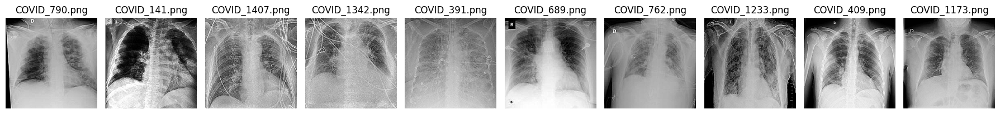

In [8]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Covid folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID' 

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Defining the filter kernel
filter_kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

# Display the images in a single row with spatial filtering
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3)) # Adjusting the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path)
        # Convert the image to grayscale
        grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # Apply spatial filtering
        filtered_image = cv2.filter2D(grayscale_image, -1, filter_kernel)
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.2.1 Fourier Transform for filtering : I defined the cutoff frequency for the low pass filter then displayed the 10 images, read the image using the gray scale, applied the Fourier transform, created the low-pass filter and then applied the inverse Fourier transform.

/tmp/ipykernel_33/2994735045.py:32: DeprecationWarning: scipy.ifft is deprecated and will be removed in SciPy 2.0.0, use scipy.fft.ifft instead
  filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))


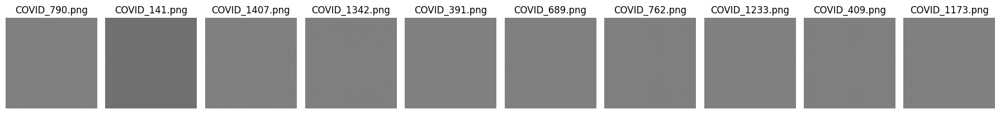

In [11]:
import os
import numpy as np
import cv2
from scipy import fft, ifft, fftpack
import matplotlib.pyplot as plt

# Covid folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID' 

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the cutoff frequency for the low-pass filter
cutoff_frequency = 0.1

# Display the images in a single row with Fourier Transform-based filtering
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3)) # Adjusting the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
        # Apply Fourier Transform
        frequency_image = fftpack.fft2(image)
        # Create a low-pass filter
        rows, cols = image.shape
        center_row, center_col = rows // 2, cols // 2
        frequency_image_filtered = frequency_image.copy()
        frequency_image_filtered[center_row - int(cutoff_frequency * center_row):center_row + int(cutoff_frequency * center_row), :] = 0
        frequency_image_filtered[:, center_col - int(cutoff_frequency * center_col):center_col + int(cutoff_frequency * center_col)] = 0
        # Apply inverse Fourier Transform
        filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.2.2 Frequency domain smoothing/sharpening: I defined the sharpening factor for the high pass filter then displayed the images, read the images using gray scale, applied Fourier transform, then created the high pass filter for sharpening and lastely, applied the inverse Fourier transform.

/tmp/ipykernel_33/382717092.py:31: DeprecationWarning: scipy.ifft is deprecated and will be removed in SciPy 2.0.0, use scipy.fft.ifft instead
  filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))


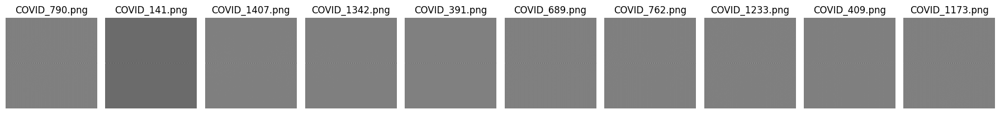

In [14]:
import os
import numpy as np
import cv2
from scipy import fft, ifft, fftpack
import matplotlib.pyplot as plt

# Covid folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID' 

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the sharpening factor for the high-pass filter
sharpening_factor = 2

# Display the images in a single row with frequency domain smoothing/sharpening
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3)) # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply Fourier Transform
        frequency_image = fftpack.fft2(image)
        # Create a high-pass filter for sharpening
        rows, cols = image.shape
        center_row, center_col = rows // 2, cols // 2
        frequency_image_filtered = frequency_image.copy()
        frequency_image_filtered[center_row, center_col] = frequency_image[center_row, center_col] * sharpening_factor
        # Apply inverse Fourier Transform
        filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


**Perform the 4 enhancement techniques for the Normal class**

2.1.1 Histogram equalization: In the Normal class I displayed 10 images and then I applied the histogram equalization.

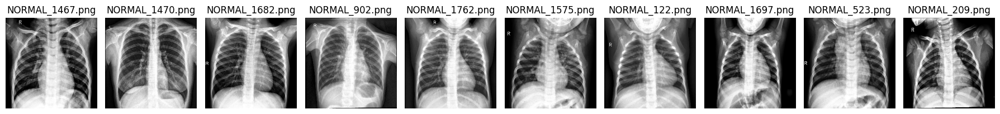

In [17]:
import os
import cv2
import matplotlib.pyplot as plt

# Normal folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Display the images in a single row
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply histogram equalization
        equalized_image = cv2.equalizeHist(image)
        ax.imshow(equalized_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.1.2 Spatial filtering: In the Normal class I defined the filter kernel and displayed 10 images using the spatial filtering and converted the image to gray scale before applying the spatial filtering technique.

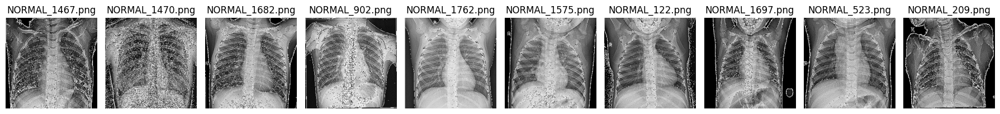

In [18]:
import os
import numpy as np
import cv2
from scipy import ndimage
import matplotlib.pyplot as plt

# Normal folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the filter kernel
filter_kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

# Display the images in a single row with spatial filtering
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply spatial filtering
        filtered_image = ndimage.convolve(image, filter_kernel)
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.2.1 Fourier Transform for filtering : I defined the cutoff frequency for the low pass filter then displayed the 10 images, read the image using the gray scale, applied the Fourier transform, created the low-pass filter and then applied the inverse Fourier transform.

/tmp/ipykernel_33/3019085509.py:32: DeprecationWarning: scipy.ifft is deprecated and will be removed in SciPy 2.0.0, use scipy.fft.ifft instead
  filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))


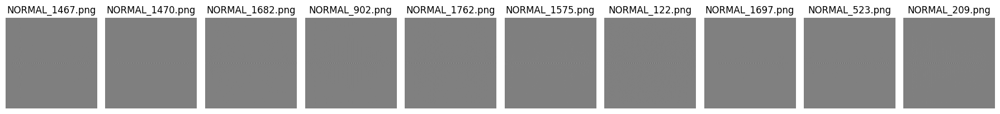

In [19]:
import os
import numpy as np
import cv2
from scipy import fft, ifft, fftpack
import matplotlib.pyplot as plt

# Normal folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the cutoff frequency for the low-pass filter
cutoff_frequency = 0.1

# Display the images in a single row with Fourier Transform-based filtering
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply Fourier Transform
        frequency_image = fftpack.fft2(image)
        # Create a low-pass filter
        rows, cols = image.shape
        center_row, center_col = rows // 2, cols // 2
        frequency_image_filtered = frequency_image.copy()
        frequency_image_filtered[center_row - int(cutoff_frequency * center_row):center_row + int(cutoff_frequency * center_row), :] = 0
        frequency_image_filtered[:, center_col - int(cutoff_frequency * center_col):center_col + int(cutoff_frequency * center_col)] = 0
        # Apply inverse Fourier Transform
        filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.2.2 Frequency domain smoothing/sharpening: I defined the sharpening factor for the high pass filter then displayed the images, read the images using gray scale, applied Fourier transform, then created the high pass filter for sharpening and lastely, applied the inverse Fourier transform.

/tmp/ipykernel_33/3425956514.py:31: DeprecationWarning: scipy.ifft is deprecated and will be removed in SciPy 2.0.0, use scipy.fft.ifft instead
  filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))


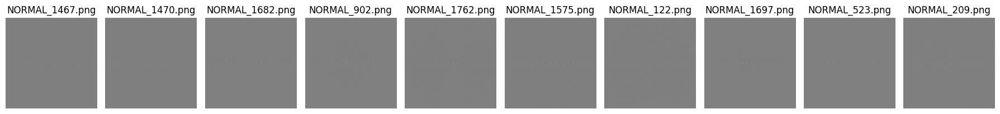

In [20]:
import os
import numpy as np
import cv2
from scipy import fft, ifft, fftpack
import matplotlib.pyplot as plt

# Normal folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL' 

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the sharpening factor for the high-pass filter
sharpening_factor = 2

# Display the images in a single row with frequency domain smoothing/sharpening
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply Fourier Transform
        frequency_image = fftpack.fft2(image)
        # Create a high-pass filter for sharpening
        rows, cols = image.shape
        center_row, center_col = rows // 2, cols // 2
        frequency_image_filtered = frequency_image.copy()
        frequency_image_filtered[center_row, center_col] = frequency_image[center_row, center_col] * sharpening_factor
        # Apply inverse Fourier Transform
        filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


**Perform the 4 enhancement techniques for the PNEUMONIA class**

2.1.1 Histogram equalization: In the Pneumonia class I displayed 10 images and then I applied the histogram equalization.

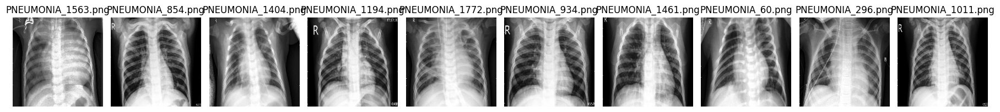

In [21]:
import os
import cv2
import matplotlib.pyplot as plt

# Pneumonia folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Display the images in a single row
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply histogram equalization
        equalized_image = cv2.equalizeHist(image)
        ax.imshow(equalized_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.1.2 Spatial filtering: In the pneumonia class I defined the filter kernel and displayed 10 images using the spatial filtering and converted the image to gray scale before applying the spatial filtering technique.

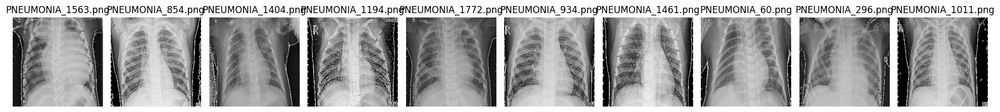

In [22]:
import os
import numpy as np
import cv2
from scipy import ndimage
import matplotlib.pyplot as plt

# Pnemonia folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA'  

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the filter kernel
filter_kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

# Display the images in a single row with spatial filtering
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply spatial filtering
        filtered_image = ndimage.convolve(image, filter_kernel)
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.2.1 Fourier Transform for filtering : I defined the cutoff frequency for the low pass filter then displayed the 10 images, read the image using the gray scale, applied the Fourier transform, created the low-pass filter and then applied the inverse Fourier transform.

/tmp/ipykernel_33/2662534375.py:32: DeprecationWarning: scipy.ifft is deprecated and will be removed in SciPy 2.0.0, use scipy.fft.ifft instead
  filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))


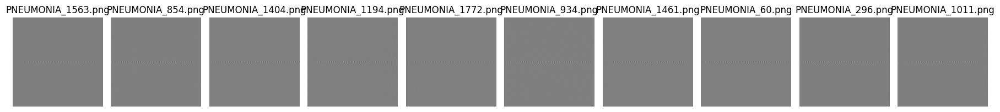

In [23]:
import os
import numpy as np
import cv2
from scipy import fft, ifft, fftpack
import matplotlib.pyplot as plt

# Pnemonia folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA' 

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the cutoff frequency for the low-pass filter
cutoff_frequency = 0.1

# Display the images in a single row with Fourier Transform-based filtering
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply Fourier Transform
        frequency_image = fftpack.fft2(image)
        # Create a low-pass filter
        rows, cols = image.shape
        center_row, center_col = rows // 2, cols // 2
        frequency_image_filtered = frequency_image.copy()
        frequency_image_filtered[center_row - int(cutoff_frequency * center_row):center_row + int(cutoff_frequency * center_row), :] = 0
        frequency_image_filtered[:, center_col - int(cutoff_frequency * center_col):center_col + int(cutoff_frequency * center_col)] = 0
        # Apply inverse Fourier Transform
        filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


2.2.2 Frequency domain smoothing/sharpening: I defined the sharpening factor for the high pass filter then displayed the images, read the images using gray scale, applied Fourier transform, then created the high pass filter for sharpening and lastely, applied the inverse Fourier transform.

/tmp/ipykernel_33/297337767.py:31: DeprecationWarning: scipy.ifft is deprecated and will be removed in SciPy 2.0.0, use scipy.fft.ifft instead
  filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))


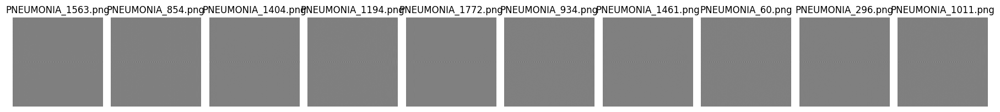

In [24]:
import os
import numpy as np
import cv2
from scipy import fft, ifft, fftpack
import matplotlib.pyplot as plt

# Pnemonia folder path containing the images
folder_path = r'/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA' 

# Get a list of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Define the sharpening factor for the high-pass filter
sharpening_factor = 2

# Display the images in a single row with frequency domain smoothing/sharpening
num_images_to_display = 10
fig, axes = plt.subplots(1, num_images_to_display, figsize=(18, 3))  # Adjust the figsize as needed
for i, ax in enumerate(axes):
    if i < num_images_to_display:
        image_path = os.path.join(folder_path, image_filenames[i])
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale using OpenCV
        # Apply Fourier Transform
        frequency_image = fftpack.fft2(image)
        # Create a high-pass filter for sharpening
        rows, cols = image.shape
        center_row, center_col = rows // 2, cols // 2
        frequency_image_filtered = frequency_image.copy()
        frequency_image_filtered[center_row, center_col] = frequency_image[center_row, center_col] * sharpening_factor
        # Apply inverse Fourier Transform
        filtered_image = np.real(ifft(fftpack.ifftshift(frequency_image_filtered)))
        ax.imshow(filtered_image, cmap='gray')
        ax.axis('off')
        ax.set_title(image_filenames[i])

plt.tight_layout()
plt.show()


# 3- Visualization and classifier testing

**COVID class**

**3.1 Visualize three random images for each type of enhancement, showing before and 
after effects**

When visualizing the random images for each class using histogram equalization and spatial filtering for the original Image where the original image shows the original chest X-ray image. Histogram equalization will enhance the contrast of the image, making it visually more appealing and improving the visibility of details and spatial Filtering using Gaussian blur will smooth the image by averaging pixel values in the vicinity, which can help reduce noise and fine details but might also blur important structures.
When performing low-pass filtering and high pass filtering for the original Image in each class first, it displayes a subplot of the original image of the chest X-ray image.Then it shows the Low-pass filtering which smooths the image, suppressing the high-frequency components like noise and fine details and lastly, shows the High-pass filtering where it will enhance the edges and high-frequency features in the image, suppressing low-frequency components.

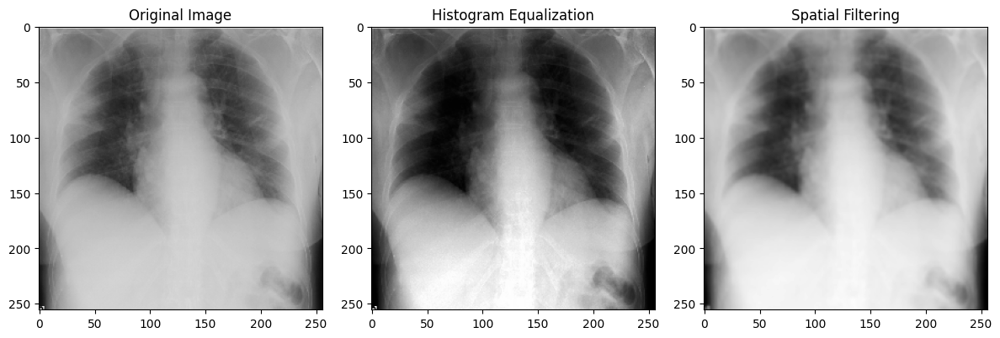

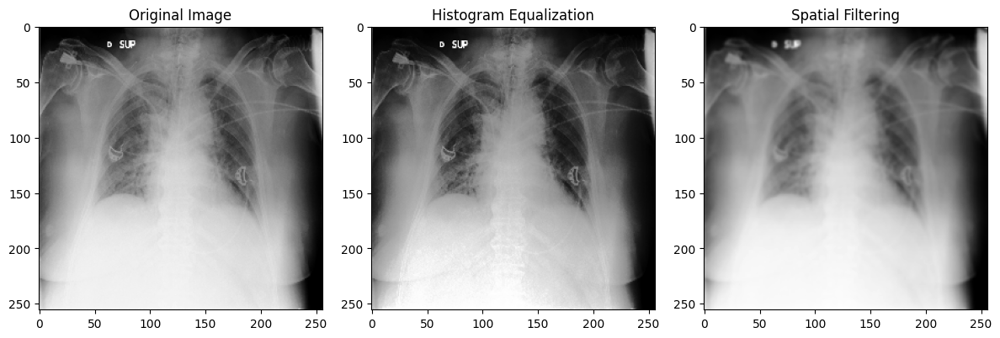

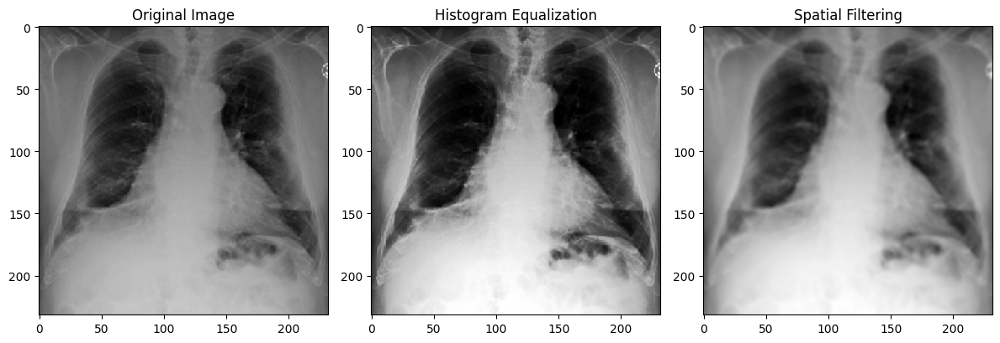

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of covid image paths
image_paths = ['/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID/COVID_10.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID/COVID_100.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID/COVID_1000.png']

# Iterate over the selected images
for image_path in image_paths:
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(image)
    # Apply spatial filtering (e.g., Gaussian blur)
    filtered_image = cv2.GaussianBlur(image, (5, 5), 0)
    # Display the original, equalized, and filtered images
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Histogram Equalization')
    plt.subplot(1, 3, 3)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Spatial Filtering')
    plt.tight_layout()
    plt.show()


**Implement at least two frequency domain enhancement methods 
(lowpass filtering and high pass filtering).** 

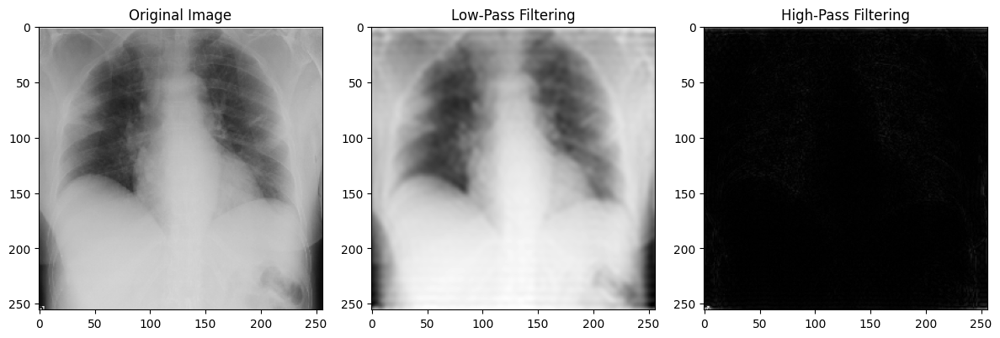

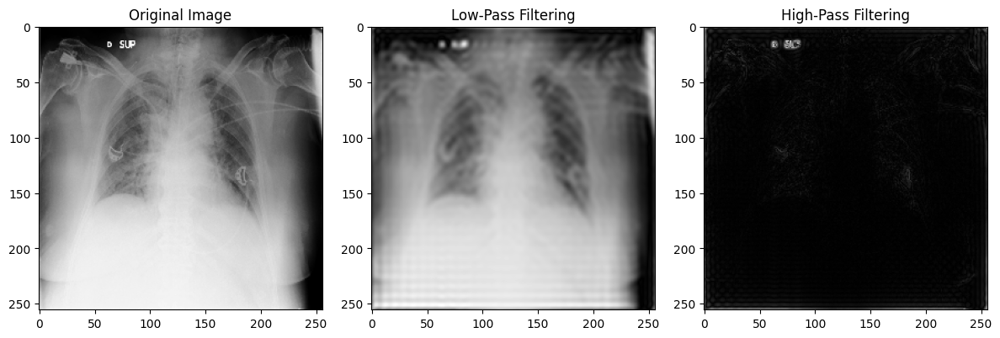

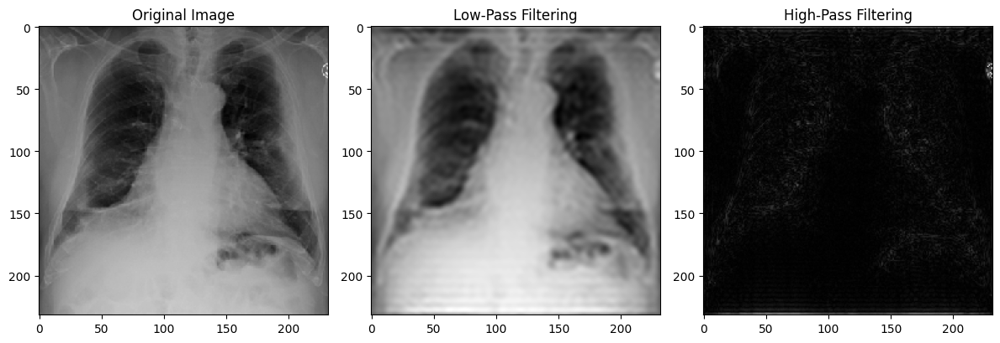

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Function to apply low-pass filtering in the frequency domain
def apply_low_pass_filter(image, cutoff_frequency):
    fft = fftpack.fft2(image)
    fft_shifted = fftpack.fftshift(fft)
    # Construct the mask for low-pass filtering
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros_like(image)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 1
    # Apply the mask to the shifted Fourier spectrum
    fft_shifted_filtered = fft_shifted * mask
    # Inverse shift and inverse Fourier transform
    fft_filtered = fftpack.ifftshift(fft_shifted_filtered)
    filtered_image = np.abs(fftpack.ifft2(fft_filtered))
    return filtered_image

# Function to apply high-pass filtering in the frequency domain
def apply_high_pass_filter(image, cutoff_frequency):
    fft = fftpack.fft2(image)
    fft_shifted = fftpack.fftshift(fft)
    # Construct the mask for high-pass filtering
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.ones_like(image)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 0
    # Apply the mask to the shifted Fourier spectrum
    fft_shifted_filtered = fft_shifted * mask
    # Inverse shift and inverse Fourier transform
    fft_filtered = fftpack.ifftshift(fft_shifted_filtered)
    filtered_image = np.abs(fftpack.ifft2(fft_filtered))
    return filtered_image

# List of the covid image paths
image_paths = ['/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID/COVID_10.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID/COVID_100.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/COVID/COVID_1000.png']

# Cutoff frequency for low-pass and high-pass filters
low_pass_cutoff = 30  # Adjust as desired
high_pass_cutoff = 30  # Adjust as desired

# Iterate over the selected images
for image_path in image_paths:
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Apply low-pass filtering
    low_pass_filtered_image = apply_low_pass_filter(image, low_pass_cutoff)
    # Apply high-pass filtering
    high_pass_filtered_image = apply_high_pass_filter(image, high_pass_cutoff)
    # Display the original, low-pass filtered, and high-pass filtered images
    plt.figure(figsize=(12, 8))
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(low_pass_filtered_image, cmap='gray')
    plt.title('Low-Pass Filtering')
    plt.subplot(1, 3, 3)
    plt.imshow(high_pass_filtered_image, cmap='gray')
    plt.title('High-Pass Filtering')
    plt.tight_layout()
    plt.show()


**NORMAL class**

**Visualize three random images for each type of enhancement, showing before and 
after effects**

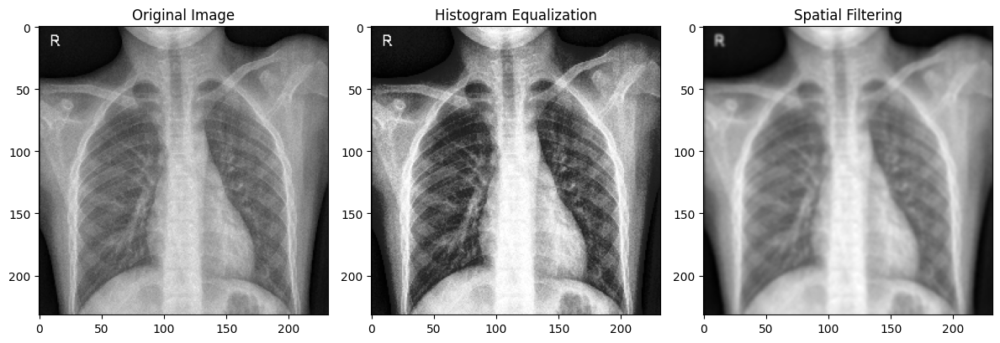

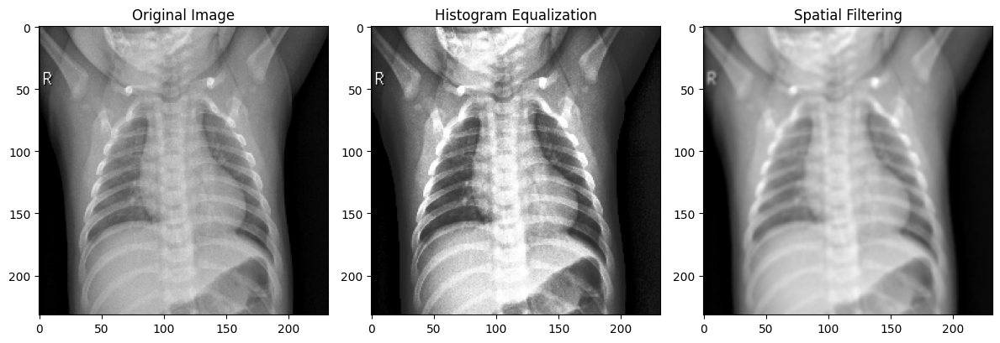

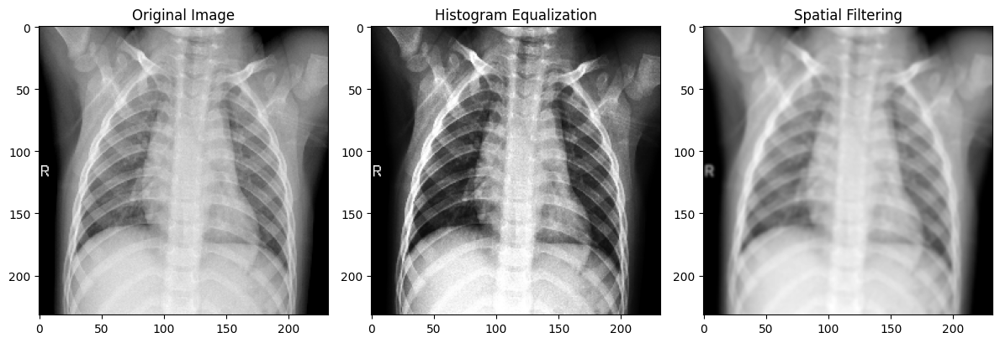

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of Normal image paths
image_paths = ['/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL/NORMAL_10.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL/NORMAL_100.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL/NORMAL_1000.png']

# Iterate over the selected images
for image_path in image_paths:
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(image)
    # Apply spatial filtering (e.g., Gaussian blur)
    filtered_image = cv2.GaussianBlur(image, (5, 5), 0)
    # Display the original, equalized, and filtered images
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Histogram Equalization')
    plt.subplot(1, 3, 3)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Spatial Filtering')
    plt.tight_layout()
    plt.show()


**Implement at least two frequency domain enhancement methods 
(lowpass filtering and high pass filtering).**

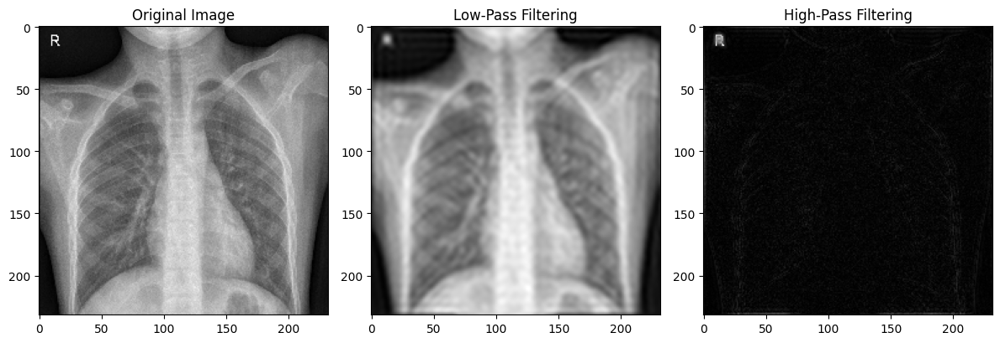

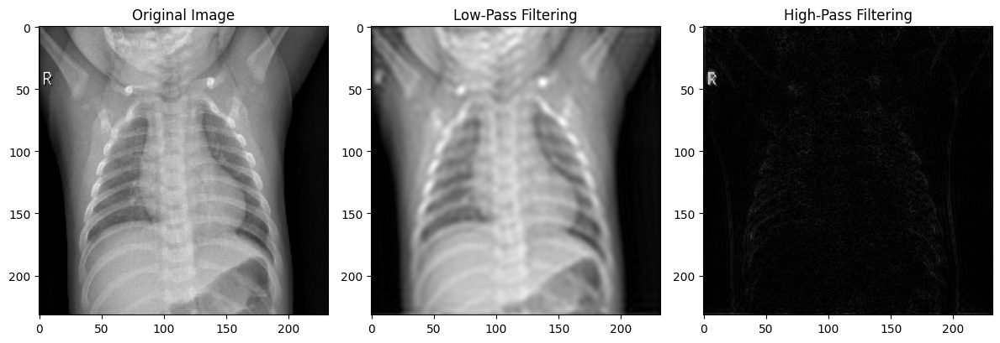

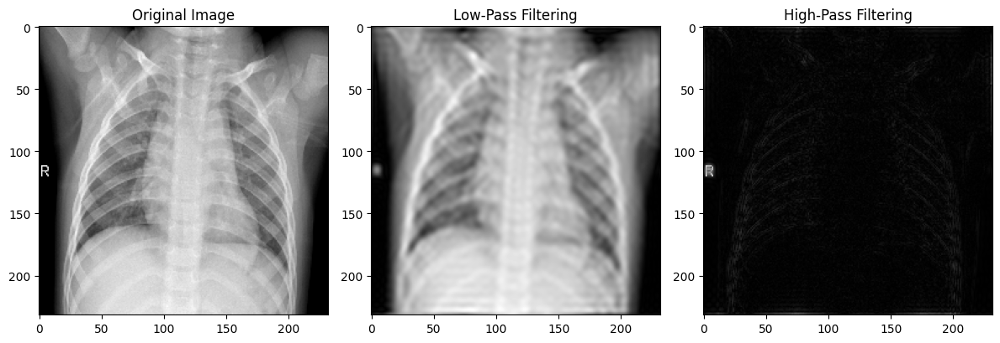

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Function to apply low-pass filtering in the frequency domain
def apply_low_pass_filter(image, cutoff_frequency):
    fft = fftpack.fft2(image)
    fft_shifted = fftpack.fftshift(fft)
    # Construct the mask for low-pass filtering
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros_like(image)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 1
    # Apply the mask to the shifted Fourier spectrum
    fft_shifted_filtered = fft_shifted * mask
    # Inverse shift and inverse Fourier transform
    fft_filtered = fftpack.ifftshift(fft_shifted_filtered)
    filtered_image = np.abs(fftpack.ifft2(fft_filtered))
    return filtered_image

# Function to apply high-pass filtering in the frequency domain
def apply_high_pass_filter(image, cutoff_frequency):
    fft = fftpack.fft2(image)
    fft_shifted = fftpack.fftshift(fft)
    # Construct the mask for high-pass filtering
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.ones_like(image)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 0
    # Apply the mask to the shifted Fourier spectrum
    fft_shifted_filtered = fft_shifted * mask
    # Inverse shift and inverse Fourier transform
    fft_filtered = fftpack.ifftshift(fft_shifted_filtered)
    filtered_image = np.abs(fftpack.ifft2(fft_filtered))
    return filtered_image

# List of the normal image paths
image_paths = ['/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL/NORMAL_10.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL/NORMAL_100.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/NORMAL/NORMAL_1000.png']

# Cutoff frequency for low-pass and high-pass filters
low_pass_cutoff = 30  # Adjust as desired
high_pass_cutoff = 30  # Adjust as desired

# Iterate over the selected images
for image_path in image_paths:
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Apply low-pass filtering
    low_pass_filtered_image = apply_low_pass_filter(image, low_pass_cutoff)
    # Apply high-pass filtering
    high_pass_filtered_image = apply_high_pass_filter(image, high_pass_cutoff)
    # Display the original, low-pass filtered, and high-pass filtered images
    plt.figure(figsize=(12, 8))
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(low_pass_filtered_image, cmap='gray')
    plt.title('Low-Pass Filtering')
    plt.subplot(1, 3, 3)
    plt.imshow(high_pass_filtered_image, cmap='gray')
    plt.title('High-Pass Filtering')
    plt.tight_layout()
    plt.show()


**PNEUMONIA class**

**Visualize three random images for each type of enhancement, showing before and 
after effects**

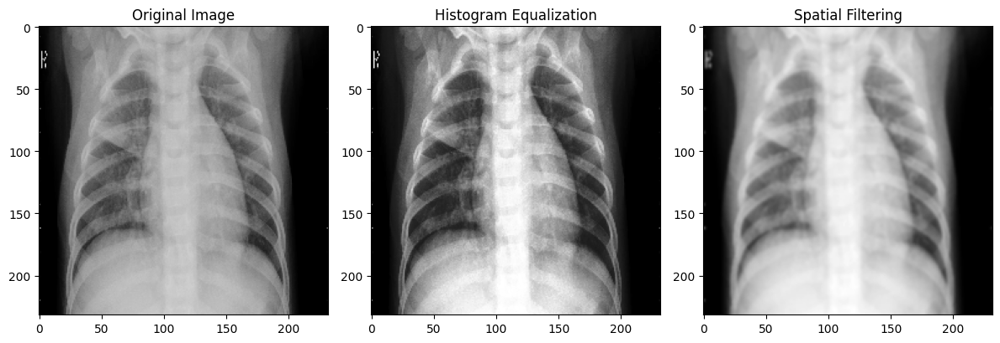

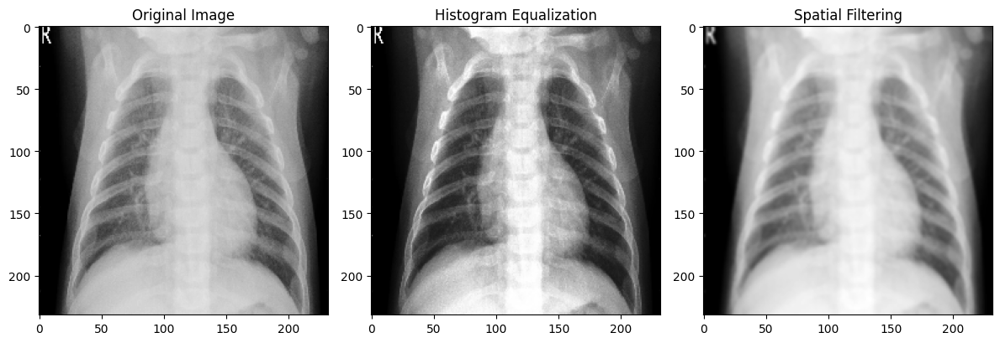

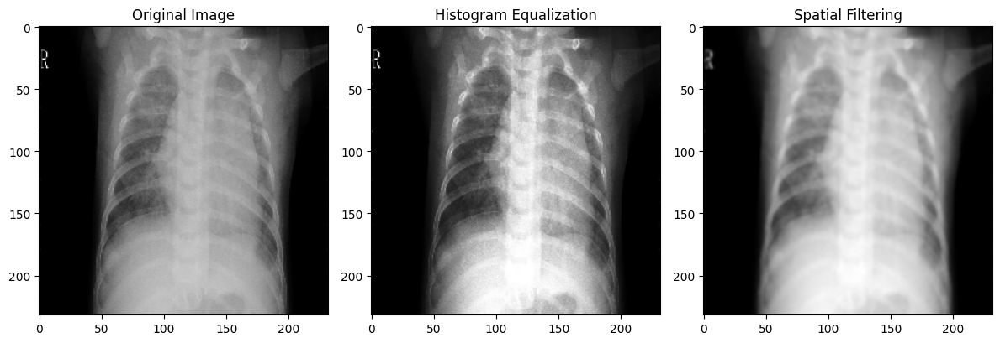

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of the pnemonia image paths
image_paths = ['/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1004.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1005.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1006.png']
# Iterate over the selected images
for image_path in image_paths:
    # Load the image in grayscale
    image = cv2.imread(image_path, 0)
    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(image)
    # Apply spatial filtering (e.g., Gaussian blur)
    filtered_image = cv2.GaussianBlur(image, (5, 5), 0)
    # Display the original, equalized, and filtered images
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Histogram Equalization')
    plt.subplot(1, 3, 3)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Spatial Filtering')
    plt.tight_layout()
    plt.show()

**Implement at least two frequency domain enhancement methods 
(lowpass filtering and high pass filtering).**

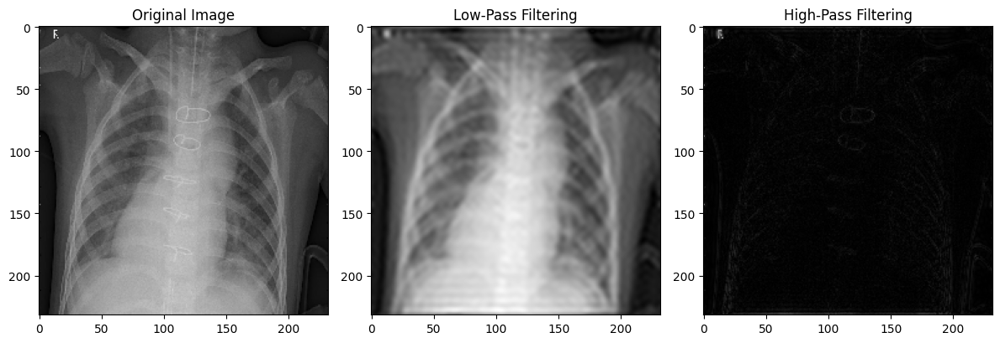

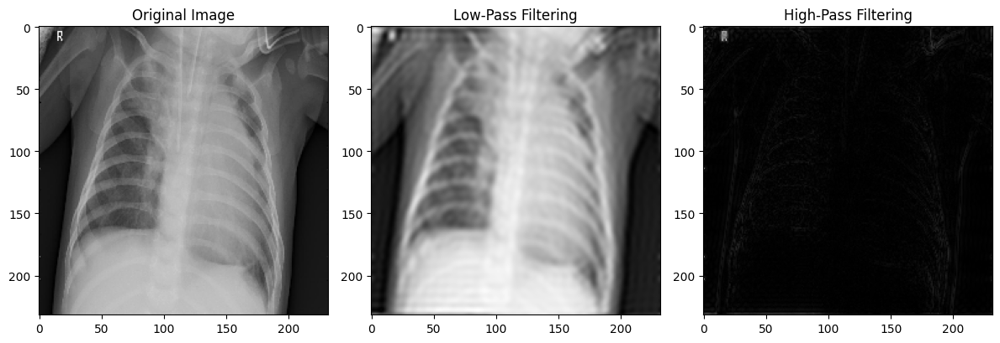

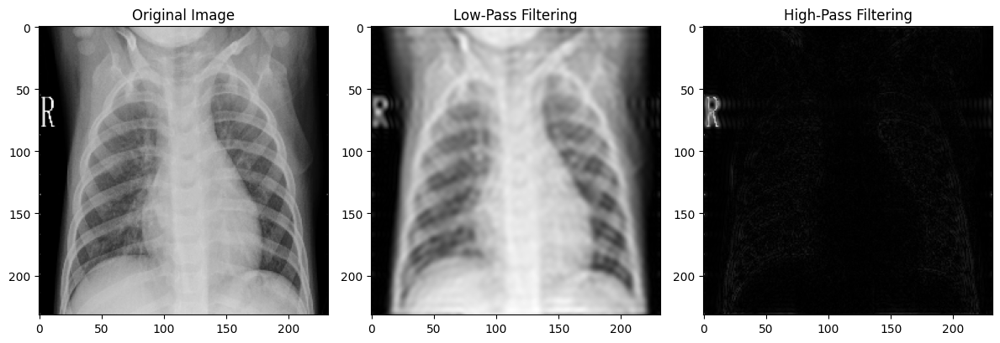

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Function to apply low-pass filtering in the frequency domain
def apply_low_pass_filter(image, cutoff_frequency):
    fft = fftpack.fft2(image)
    fft_shifted = fftpack.fftshift(fft)
    
    # Construct the mask for low-pass filtering
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.zeros_like(image)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 1
    
    # Apply the mask to the shifted Fourier spectrum
    fft_shifted_filtered = fft_shifted * mask
    
    # Inverse shift and inverse Fourier transform
    fft_filtered = fftpack.ifftshift(fft_shifted_filtered)
    filtered_image = np.abs(fftpack.ifft2(fft_filtered))
    
    return filtered_image

# Function to apply high-pass filtering in the frequency domain
def apply_high_pass_filter(image, cutoff_frequency):
    fft = fftpack.fft2(image)
    fft_shifted = fftpack.fftshift(fft)
    
    # Construct the mask for high-pass filtering
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2
    mask = np.ones_like(image)
    mask[center_row - cutoff_frequency:center_row + cutoff_frequency,
         center_col - cutoff_frequency:center_col + cutoff_frequency] = 0
    
    # Apply the mask to the shifted Fourier spectrum
    fft_shifted_filtered = fft_shifted * mask
    
    # Inverse shift and inverse Fourier transform
    fft_filtered = fftpack.ifftshift(fft_shifted_filtered)
    filtered_image = np.abs(fftpack.ifft2(fft_filtered))
    
    return filtered_image

# List of the pnemonia image paths
image_paths = ['/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_10.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_100.png',
               '/kaggle/input/covid-pneumonia-normal-chest-xray-images/PNEUMONIA/PNEUMONIA_1000.png']

# Cutoff frequency for low-pass and high-pass filters
low_pass_cutoff = 30  # Adjust as desired
high_pass_cutoff = 30  # Adjust as desired

# Iterate over the selected images
for image_path in image_paths:
    # Load the image in grayscale
    image = cv2.imread(image_path, 0)
    
    # Apply low-pass filtering
    low_pass_filtered_image = apply_low_pass_filter(image, low_pass_cutoff)
    
    # Apply high-pass filtering
    high_pass_filtered_image = apply_high_pass_filter(image, high_pass_cutoff)
    
    # Display the original, low-pass filtered, and high-pass filtered images
    plt.figure(figsize=(12, 8))
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(low_pass_filtered_image, cmap='gray')
    plt.title('Low-Pass Filtering')
    plt.subplot(1, 3, 3)
    plt.imshow(high_pass_filtered_image, cmap='gray')
    plt.title('High-Pass Filtering')
    plt.tight_layout()
    plt.show()

**3.2 Test the enhanced images using three classifiers: CNN, SVM, and 
Random Forest**

**Testing all classes**

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

image_dir = '/kaggle/input/covid-pneumonia-normal-chest-xray-images'

# Load image data and labels
image_data = []
labels = []
for class_name in os.listdir(image_dir):
    class_dir = os.path.join(image_dir, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        image = load_img(image_path, target_size=(128, 128))
        image = np.array(image)
        image_data.append(image)
        labels.append(class_name)

image_data = np.array(image_data)
labels = np.array(labels)

# Encode labels to numerical form
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Normalize the pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# CNN classifier
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Conv2D(64, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Conv2D(128, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=10, batch_size=32)
_, cnn_accuracy = model.evaluate(X_test, y_test)

# SVM classifier
X_train_flattened = X_train.reshape(X_train.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)
svm_model = SVC()
svm_model.fit(X_train_flattened, y_train)
svm_pred = svm_model.predict(X_test_flattened)
svm_accuracy = accuracy_score(y_test, svm_pred)

# Random Forest classifier
rf_model = RandomForestClassifier()
rf_model.fit(X_train_flattened, y_train)
rf_pred = rf_model.predict(X_test_flattened)
rf_accuracy = accuracy_score(y_test, rf_pred)

# Print the accuracies of all classifiers
print("CNN Accuracy:", cnn_accuracy)
print("SVM Accuracy:", svm_accuracy)
print("Random Forest Accuracy:", rf_accuracy)

2024-04-24 11:41:49.101787: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-24 11:41:49.101916: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-24 11:41:49.314636: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/nn.py:669: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


131/131 ━━━━━━━━━━━━━━━━━━━━ 60s 444ms/step - accuracy: 0.3592 - loss: -45506.2969
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 58s 444ms/step - accuracy: 0.3510 - loss: -24728886.0000
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 84s 459ms/step - accuracy: 0.3459 - loss: -710405504.0000
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 62s 472ms/step - accuracy: 0.3593 - loss: -6304920576.0000
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 61s 468ms/step - accuracy: 0.3626 - loss: -28336529408.0000
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 78s 440ms/step - accuracy: 0.3574 - loss: -90596327424.0000
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 452ms/step - accuracy: 0.3595 - loss: -217385877504.0000
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 58s 443ms/step - accuracy: 0.3629 - loss: -503987306496.0000
Epoch 9/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 80s 430ms/step - accuracy: 0.3551 - loss: -974684028928.0000
Epoch 10/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 57s 433ms/step - accuracy: 0.3525 - loss: -1748082360320.0000
33/33 ━━━━━━━━━━━

***SVM has the highest accuracy with 0.95602 which means it performs better for my classification task then the Random Forest and the least accuracy is the CNN.***

In [2]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report

image_dir = '/kaggle/input/covid-pneumonia-normal-chest-xray-images'

# Load image data and labels
image_data = []
labels = []
for class_name in os.listdir(image_dir):
    class_dir = os.path.join(image_dir, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        image = load_img(image_path, target_size=(128, 128))
        image = np.array(image)
        image_data.append(image)
        labels.append(class_name)

image_data = np.array(image_data)
labels = np.array(labels)

# Encode labels to numerical form
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Normalize the pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# CNN classifier
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=['accuracy']
)

model.fit(X_train, y_train, epochs=10, batch_size=32)

cnn_pred = model.predict(X_test)
cnn_pred = np.argmax(cnn_pred, axis=1)

# SVM classifier
X_train_flattened = X_train.reshape(X_train.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)

svm_model = SVC()
svm_model.fit(X_train_flattened, y_train)
svm_pred = svm_model.predict(X_test_flattened)

# Random Forest classifier
rf_model = RandomForestClassifier()
rf_model.fit(X_train_flattened, y_train)
rf_pred = rf_model.predict(X_test_flattened)

# Convert numerical labels back to original string labels
y_test = label_encoder.inverse_transform(y_test)
cnn_pred = label_encoder.inverse_transform(cnn_pred)
svm_pred = label_encoder.inverse_transform(svm_pred)
rf_pred = label_encoder.inverse_transform(rf_pred)

# Evaluate performance using classification report
print("CNN Classification Report:")
print(classification_report(y_test, cnn_pred))

print("SVM Classification Report:")
print(classification_report(y_test, svm_pred))

print("Random Forest Classification Report:")
print(classification_report(y_test, rf_pred))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/nn.py:669: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


131/131 ━━━━━━━━━━━━━━━━━━━━ 63s 468ms/step - accuracy: 0.3585 - loss: -86249.1250
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 60s 459ms/step - accuracy: 0.3546 - loss: -53215656.0000
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 79s 438ms/step - accuracy: 0.3517 - loss: -1232204416.0000
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 445ms/step - accuracy: 0.3497 - loss: -12019224576.0000
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 59s 450ms/step - accuracy: 0.3482 - loss: -69944762368.0000
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 59s 447ms/step - accuracy: 0.3404 - loss: -219954249728.0000
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 79s 427ms/step - accuracy: 0.3641 - loss: -546498904064.0000
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 433ms/step - accuracy: 0.3502 - loss: -1328676995072.0000
Epoch 9/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 58s 439ms/step - accuracy: 0.3559 - loss: -2212983472128.0000
Epoch 10/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 58s 445ms/step - accuracy: 0.3455 - loss: -3900017213440.0000
33/33 ━━━━━━

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# 4- Comparison and Analysis

**Create a comparison table to evaluate the four enhancements based 
on their impact on classifier performance.**


4.1. Histogram Equalization

In [7]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Function to apply Histogram Equalization
def apply_histogram_equalization(image):
    hist_equalized = cv2.equalizeHist(image)
    return hist_equalized

image_dir = '/kaggle/input/covid-pneumonia-normal-chest-xray-images'

# Load image data and labels
image_data = []
labels = []

for class_name in os.listdir(image_dir):
    class_dir = os.path.join(image_dir, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        image = load_img(image_path, target_size=(128, 128), color_mode='grayscale')
        image = np.array(image)

        # Apply enhancement techniques
        hist_equalized = apply_histogram_equalization(image)

        # Append enhanced images to the dataset
        image_data.extend([hist_equalized])
        labels.extend([class_name] * 1)

image_data = np.array(image_data)
labels = np.array(labels)

# Encode labels to numerical form
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Normalize the pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# CNN classifier
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# SVM classifier
svm_classifier = SVC()
svm_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Random Forest classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Make predictions on the testing set
cnn_predictions = model.predict(X_test)
svm_predictions = svm_classifier.predict(X_test.reshape(X_test.shape[0], -1))
rf_predictions = rf_classifier.predict(X_test.reshape(X_test.shape[0], -1))

# Convert predictions to class labels
cnn_predictions = np.round(cnn_predictions).astype(int)
svm_predictions = svm_predictions.astype(int)
rf_predictions = rf_predictions.astype(int)

# Calculate evaluation metrics
cnn_accuracy = accuracy_score(y_test, cnn_predictions)
svm_accuracy = accuracy_score(y_test, svm_predictions)
rf_accuracy = accuracy_score(y_test, rf_predictions)

cnn_precision = precision_score(y_test, cnn_predictions, average='macro')
svm_precision = precision_score(y_test, svm_predictions, average='macro')
rf_precision = precision_score(y_test, rf_predictions, average='macro')

cnn_recall = recall_score(y_test, cnn_predictions, average='macro')
svm_recall = recall_score(y_test, svm_predictions, average='macro')
rf_recall = recall_score(y_test, rf_predictions, average='macro')

cnn_f1_score = f1_score(y_test, cnn_predictions, average='macro')
svm_f1_score = f1_score(y_test, svm_predictions, average='macro')
rf_f1_score = f1_score(y_test, rf_predictions, average='macro')

# Print evaluation metrics
print("CNN Accuracy:", cnn_accuracy)
print("CNN Precision:", cnn_precision)
print("CNN Recall:", cnn_recall)
print("CNN F1 Score:", cnn_f1_score)

print("SVM Accuracy:", svm_accuracy)
print("SVM Precision:", svm_precision)
print("SVM Recall:", svm_recall)
print("SVM F1 Score:", svm_f1_score)

print("Random Forest Accuracy:", rf_accuracy)
print("Random Forest Precision:", rf_precision)
print("Random Forest Recall:", rf_recall)
print("Random Forest F1 Score:", rf_f1_score)


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 69s 513ms/step - accuracy: 0.3571 - loss: -107278.5781 - val_accuracy: 0.3174 - val_loss: -8112081.5000
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 80s 501ms/step - accuracy: 0.3427 - loss: -64198768.0000 - val_accuracy: 0.3174 - val_loss: -815930368.0000
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 506ms/step - accuracy: 0.3526 - loss: -1873511936.0000 - val_accuracy: 0.3174 - val_loss: -9305684992.0000
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 80s 492ms/step - accuracy: 0.3482 - loss: -14576133120.0000 - val_accuracy: 0.3174 - val_loss: -49243779072.0000
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 498ms/step - accuracy: 0.3559 - loss: -62141743104.0000 - val_accuracy: 0.3174 - val_loss: -165553750016.0000
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 65s 499ms/step - accuracy: 0.3537 - loss: -209988435968.0000 - val_accuracy: 0.3174 - val_loss: -423709573120.0000
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 65s 498ms/step - accuracy: 0.3493 - loss: -496920690688

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


4.2. Spatial Filtering


In [8]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Function to apply Spatial Filtering
def apply_spatial_filtering(image):
    kernel = np.ones((3, 3), np.float32) / 9
    filtered_image = cv2.filter2D(image, -1, kernel)
    return filtered_image

image_dir = '/kaggle/input/covid-pneumonia-normal-chest-xray-images'

# Load image data and labels
image_data = []
labels = []

for class_name in os.listdir(image_dir):
    class_dir = os.path.join(image_dir, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        image = load_img(image_path, target_size=(128, 128), color_mode='grayscale')
        image = np.array(image)

        # Apply enhancement techniques
        spatial_filtered = apply_spatial_filtering(image)

        # Append enhanced images to the dataset
        image_data.extend([spatial_filtered])
        labels.extend([class_name] * 1)

image_data = np.array(image_data)
labels = np.array(labels)

# Encode labels to numerical form
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Normalize the pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# CNN classifier
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# SVM classifier
svm_classifier = SVC()
svm_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Random Forest classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Make predictions on the testing set
cnn_predictions = model.predict(X_test)
svm_predictions = svm_classifier.predict(X_test.reshape(X_test.shape[0], -1))
rf_predictions = rf_classifier.predict(X_test.reshape(X_test.shape[0], -1))

# Convert predictions to class labels
cnn_predictions = np.round(cnn_predictions).astype(int)
svm_predictions = svm_predictions.astype(int)
rf_predictions = rf_predictions.astype(int)

# Calculate evaluation metrics
cnn_accuracy = accuracy_score(y_test, cnn_predictions)
svm_accuracy = accuracy_score(y_test, svm_predictions)
rf_accuracy = accuracy_score(y_test, rf_predictions)

cnn_precision = precision_score(y_test, cnn_predictions, average='macro')
svm_precision = precision_score(y_test, svm_predictions, average='macro')
rf_precision = precision_score(y_test, rf_predictions, average='macro')

cnn_recall = recall_score(y_test, cnn_predictions, average='macro')
svm_recall = recall_score(y_test, svm_predictions, average='macro')
rf_recall = recall_score(y_test, rf_predictions, average='macro')

cnn_f1_score = f1_score(y_test, cnn_predictions, average='macro')
svm_f1_score = f1_score(y_test, svm_predictions, average='macro')
rf_f1_score = f1_score(y_test, rf_predictions, average='macro')

# Print evaluation metrics
print("CNN Accuracy:", cnn_accuracy)
print("CNN Precision:", cnn_precision)
print("CNN Recall:", cnn_recall)
print("CNN F1 Score:", cnn_f1_score)

print("SVM Accuracy:", svm_accuracy)
print("SVM Precision:", svm_precision)
print("SVM Recall:", svm_recall)
print("SVM F1 Score:", svm_f1_score)

print("Random Forest Accuracy:", rf_accuracy)
print("Random Forest Precision:", rf_precision)
print("Random Forest Recall:", rf_recall)
print("Random Forest F1 Score:", rf_f1_score)


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 69s 511ms/step - accuracy: 0.3634 - loss: -28320.2246 - val_accuracy: 0.3174 - val_loss: -2215767.0000
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 66s 500ms/step - accuracy: 0.3457 - loss: -15791021.0000 - val_accuracy: 0.3184 - val_loss: -205529040.0000
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 81s 493ms/step - accuracy: 0.3537 - loss: -434614016.0000 - val_accuracy: 0.3203 - val_loss: -2444839168.0000
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 500ms/step - accuracy: 0.3599 - loss: -3960254464.0000 - val_accuracy: 0.3203 - val_loss: -13170829312.0000
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 65s 500ms/step - accuracy: 0.3464 - loss: -18342131712.0000 - val_accuracy: 0.3203 - val_loss: -46642438144.0000
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 65s 494ms/step - accuracy: 0.3545 - loss: -53031780352.0000 - val_accuracy: 0.3203 - val_loss: -124280872960.0000
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 82s 492ms/step - accuracy: 0.3543 - loss: -138246356992.0000

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


4.3.Low-Pass Filtering


In [1]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Function to apply Low-Pass Filtering
def apply_low_pass_filtering(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.ones((rows, cols, 2), np.uint8)
    mask[crow - 30:crow + 30, ccol - 30:ccol + 30] = 0
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    filtered_image = cv2.idft(f_ishift)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])
    return filtered_image 

image_dir = '/kaggle/input/covid-pneumonia-normal-chest-xray-images'

# Load image data and labels
image_data = []
labels = []
for class_name in os.listdir(image_dir):
    class_dir = os.path.join(image_dir, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        image = load_img(image_path, target_size=(128, 128), color_mode='grayscale')
        image = np.array(image)
        
        # Apply enhancement techniques
        low_pass_filtered = apply_low_pass_filtering(image) 
        
        # Append enhanced images to the dataset
        image_data.extend([low_pass_filtered])
        labels.extend([class_name] * 1)

image_data = np.array(image_data)
labels = np.array(labels)

# Encode labels to numerical form
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Normalize the pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# CNN classifier
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# SVM classifier
svm_classifier = SVC()
svm_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Random Forest classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Make predictions on the testing set
cnn_predictions = model.predict(X_test)
svm_predictions = svm_classifier.predict(X_test.reshape(X_test.shape[0], -1))
rf_predictions = rf_classifier.predict(X_test.reshape(X_test.shape[0], -1))

# Convert predictions to class labels
cnn_predictions = np.round(cnn_predictions).astype(int)
svm_predictions = svm_predictions.astype(int)
rf_predictions = rf_predictions.astype(int)

# Calculate evaluation metrics
cnn_accuracy = accuracy_score(y_test, cnn_predictions)
svm_accuracy = accuracy_score(y_test, svm_predictions)
rf_accuracy = accuracy_score(y_test, rf_predictions)

cnn_precision = precision_score(y_test, cnn_predictions, average='macro')
svm_precision = precision_score(y_test, svm_predictions, average='macro')
rf_precision = precision_score(y_test, rf_predictions, average='macro')

cnn_recall = recall_score(y_test, cnn_predictions, average='macro')
svm_recall = recall_score(y_test, svm_predictions, average='macro')
rf_recall = recall_score(y_test, rf_predictions, average='macro')

cnn_f1_score = f1_score(y_test, cnn_predictions, average='macro')
svm_f1_score = f1_score(y_test, svm_predictions, average='macro')
rf_f1_score = f1_score(y_test, rf_predictions, average='macro')

# Print evaluation metrics
print("CNN Accuracy:", cnn_accuracy)
print("CNN Precision:", cnn_precision)
print("CNN Recall:", cnn_recall)
print("CNN F1 Score:", cnn_f1_score)

print("SVM Accuracy:", svm_accuracy)
print("SVM Precision:", svm_precision)
print("SVM Recall:", svm_recall)
print("SVM F1 Score:", svm_f1_score)

print("Random Forest Accuracy:", rf_accuracy)
print("Random Forest Precision:", rf_precision)
print("Random Forest Recall:", rf_recall)
print("Random Forest F1 Score:", rf_f1_score)


2024-04-25 17:14:16.493165: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-25 17:14:16.493316: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-25 17:14:16.664434: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 70s 516ms/step - accuracy: 0.3632 - loss: -176789968.0000 - val_accuracy: 0.3174 - val_loss: -10654599168.0000
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 81s 509ms/step - accuracy: 0.3508 - loss: -64578260992.0000 - val_accuracy: 0.3174 - val_loss: -769579483136.0000
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 81s 504ms/step - accuracy: 0.3443 - loss: -1477551456256.0000 - val_accuracy: 0.3174 - val_loss: -8503272407040.0000
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 66s 505ms/step - accuracy: 0.3560 - loss: -12001602437120.0000 - val_accuracy: 0.3174 - val_loss: -43917357613056.0000
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 82s 503ms/step - accuracy: 0.3524 - loss: -54038708092928.0000 - val_accuracy: 0.3174 - val_loss: -148913713577984.0000
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 66s 500ms/step - accuracy: 0.3582 - loss: -183988396228608.0000 - val_accuracy: 0.3174 - val_loss: -382312453767168.0000
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 66s 503ms/step - a

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


4.4. high_pass_filtered

In [2]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Function to apply High-Pass Filtering
def apply_high_pass_filtering(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask[crow - 30:crow + 30, ccol - 30:ccol + 30] = 1
    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    filtered_image = cv2.idft(f_ishift)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])
    return filtered_image 

image_dir = '/kaggle/input/covid-pneumonia-normal-chest-xray-images'

# Load image data and labels
image_data = []
labels = []
for class_name in os.listdir(image_dir):
    class_dir = os.path.join(image_dir, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        image = load_img(image_path, target_size=(128, 128), color_mode='grayscale')
        image = np.array(image)
        
        # Apply enhancement techniques
        high_pass_filtered = apply_high_pass_filtering(image) 
        
        # Append enhanced images to the dataset
        image_data.extend([high_pass_filtered])
        labels.extend([class_name] * 1)

image_data = np.array(image_data)
labels = np.array(labels)

# Encode labels to numerical form
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(image_data, labels, test_size=0.2, random_state=42)

# Normalize the pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# CNN classifier
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# SVM classifier
svm_classifier = SVC()
svm_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Random Forest classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train.reshape(X_train.shape[0], -1), y_train)

# Make predictions on the testing set
cnn_predictions = model.predict(X_test)
svm_predictions = svm_classifier.predict(X_test.reshape(X_test.shape[0], -1))
rf_predictions = rf_classifier.predict(X_test.reshape(X_test.shape[0], -1))

# Convert predictions to class labels
cnn_predictions = np.round(cnn_predictions).astype(int)
svm_predictions = svm_predictions.astype(int)
rf_predictions = rf_predictions.astype(int)

# Calculate evaluation metrics
cnn_accuracy = accuracy_score(y_test, cnn_predictions)
svm_accuracy = accuracy_score(y_test, svm_predictions)
rf_accuracy = accuracy_score(y_test, rf_predictions)

cnn_precision = precision_score(y_test, cnn_predictions, average='macro')
svm_precision = precision_score(y_test, svm_predictions, average='macro')
rf_precision = precision_score(y_test, rf_predictions, average='macro')

cnn_recall = recall_score(y_test, cnn_predictions, average='macro')
svm_recall = recall_score(y_test, svm_predictions, average='macro')
rf_recall = recall_score(y_test, rf_predictions, average='macro')

cnn_f1_score = f1_score(y_test, cnn_predictions, average='macro')
svm_f1_score = f1_score(y_test, svm_predictions, average='macro')
rf_f1_score = f1_score(y_test, rf_predictions, average='macro')

# Print evaluation metrics
print("CNN Accuracy:", cnn_accuracy)
print("CNN Precision:", cnn_precision)
print("CNN Recall:", cnn_recall)
print("CNN F1 Score:", cnn_f1_score)

print("SVM Accuracy:", svm_accuracy)
print("SVM Precision:", svm_precision)
print("SVM Recall:", svm_recall)
print("SVM F1 Score:", svm_f1_score)

print("Random Forest Accuracy:", rf_accuracy)
print("Random Forest Precision:", rf_precision)
print("Random Forest Recall:", rf_recall)
print("Random Forest F1 Score:", rf_f1_score)


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 68s 505ms/step - accuracy: 0.3785 - loss: -123989032.0000 - val_accuracy: 0.3174 - val_loss: -8710746112.0000
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 65s 497ms/step - accuracy: 0.3443 - loss: -60028534784.0000 - val_accuracy: 0.3174 - val_loss: -867862839296.0000
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 65s 498ms/step - accuracy: 0.3556 - loss: -1915305984000.0000 - val_accuracy: 0.3193 - val_loss: -10464320815104.0000
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 65s 499ms/step - accuracy: 0.3444 - loss: -17333966864384.0000 - val_accuracy: 0.3212 - val_loss: -55710771576832.0000
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 81s 493ms/step - accuracy: 0.3600 - loss: -72562818154496.0000 - val_accuracy: 0.3212 - val_loss: -184642690875392.0000
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 64s 490ms/step - accuracy: 0.3630 - loss: -214823442841600.0000 - val_accuracy: 0.3212 - val_loss: -494772716306432.0000
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 82s 491ms/step - a

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


***When applying histogram equalization,spatial filtering,low-pass filtering and high-pass filtering for all the classes the SVM had the highest accuracy,precision,recall and F1 score which makes it more effective.***